<a href="https://colab.research.google.com/github/emanueleiacca/ADM-HW4/blob/main/DataPreparation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Using Dataset from [HW4](https://github.com/Sapienza-University-Rome/ADM/blob/master/2024/Homework_4/README.md)

## Clustering Evaluation Metrics


### 1. Sum of Squared Distances (SSD)
- **Definition**: SSD measures the compactness of clusters by calculating the sum of squared distances between each point in a cluster and its centroid.
- **Purpose**: Lower SSD indicates more compact clusters.
- **Limitation**: SSD decreases with increasing $k$, which can make it hard to determine the optimal number of clusters without additional methods.
- **Formula**:
  $\text{SSD} = \sum_{k=1}^{K} \sum_{i \in C_k} ||x_i - \mu_k||^2$
  where $C_k$ is the $k-th$ cluster, $x_i$ is a point in the cluster, and $mu_k$ is the cluster centroid.


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:8

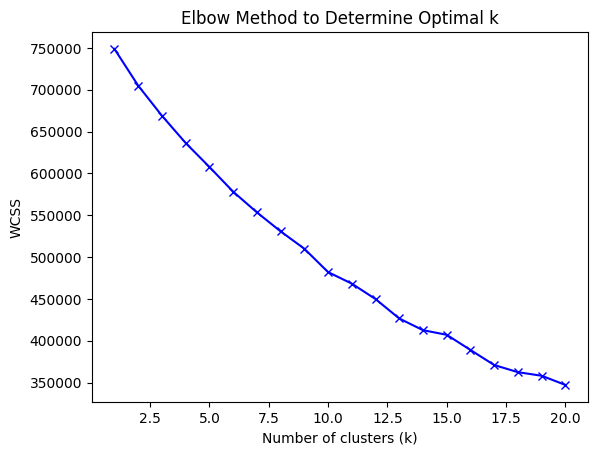

In [44]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

ssd = []
K = range(1, 21)  # clusters to try
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_features)
    ssd.append(kmeans.inertia_)  # SSD

# Plot
plt.plot(K, ssd, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.title('Elbow Method to Determine Optimal k')
plt.show()


##### Results
The curve decreases as $k$ increases, which is expected because adding more clusters reduces the distances between points and their cluster centroids.
There is no noticeable "elbow point" so we are gonna do some furter checks

### 2. Silhouette Score
- **Definition**: Silhouette Score measures how well-separated the clusters are by considering both intra-cluster cohesion and inter-cluster separation.
- **Purpose**: Higher values (close to 1) indicate better-defined clusters.
- **Formula**:$
  S(i) = \frac{b(i) - a(i)}{\max(a(i), b(i))}
  $
  where:
  - $a(i)$: Average distance of a point $i$ to other points in the same cluster (cohesion).
  - $b(i)$: Average distance of a point $i$ to points in the nearest cluster (separation).


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:8

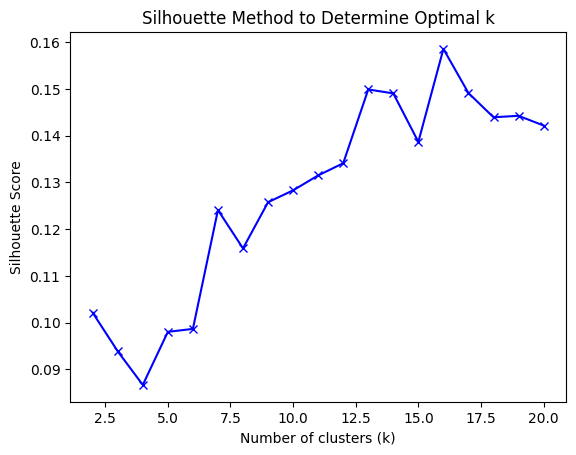

In [45]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
K = range(2, 21)  # Silhouette is undefined for k=1
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(scaled_features)
    score = silhouette_score(scaled_features, labels)
    silhouette_scores.append(score)

# Plot
plt.plot(K, silhouette_scores, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method to Determine Optimal k')
plt.show()


##### Results

Same as SSD, the Silhoutte Score improve as the number of clusters improve. We want to find a point that maximize both metric but keep the process still efficient. Too many cluster may confuse the interpretation of the model

### 3. Elbow Method (SSD/WCSS) vs. Silhouette Method

Plotting this two methods together we have a sort of trade-off between being compact (given by SSD) and being well separated (given by Silhoutte score), this allow us to overcome the limitation of both methods (Actually Silhoutte deal with compactness but in a less computer efficiency way). Also Silhoutte may prefer greater value of k due to slight improvements in separation, with the risk of losing interpretability


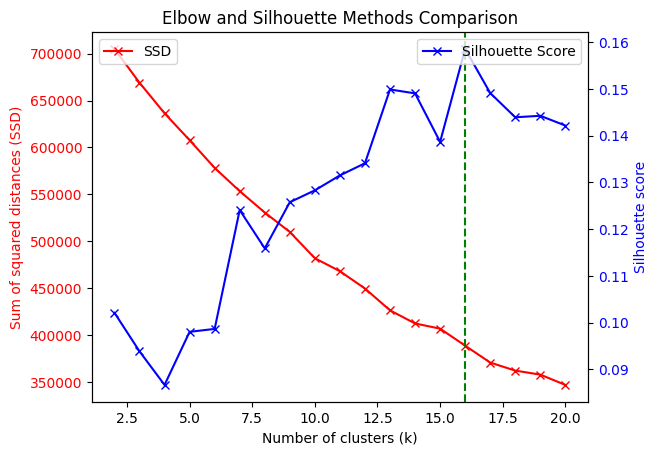

In [46]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Plot
fig, ax1 = plt.subplots()

# SSD (Elbow Method)
ax1.set_xlabel('Number of clusters (k)')
ax1.set_ylabel('Sum of squared distances (SSD)', color='red')
ax1.plot(K, ssd[1:], 'rx-', label='SSD')
ax1.tick_params(axis='y', labelcolor='red')
ax1.legend(loc="upper left")

# Silhouette Scores on a second y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Silhouette score', color='blue')
ax2.plot(K, silhouette_scores, 'bx-', label='Silhouette Score')
ax2.tick_params(axis='y', labelcolor='blue')
ax2.legend(loc="upper right")

# Highlight key points (optimality value of k)
optimal_k_silhouette = np.argmax(silhouette_scores) + 2  # Add 2 because range starts at 2
plt.axvline(x=optimal_k_silhouette, color='green', linestyle='--', label=f'Peak Silhouette (k={optimal_k_silhouette})')

plt.title('Elbow and Silhouette Methods Comparison')
plt.show()

The interaction between the two metrics gave us 2 possible results:
- either we want to maximize both the metrics, in the case n_cluster = 18 may be the best solution
- we want efficiency, so a good balance that maximize both metric may led to an optimal result that achieve good performance with less computational resources

### 4. Davies-Bouldin Index
- **Definition**: Measures the ratio of intra-cluster distances to inter-cluster separation.
- **Purpose**: Lower values indicate better clustering (compact and well-separated clusters).
- **Formula**: $
  DB = \frac{1}{k} \sum_{i=1}^{k} \max_{j \neq i} \frac{s_i + s_j}{d_{i,j}}$
  where:
  - $s_i$: Average distance of points in cluster $i$ to their centroid.
  - $d_{i,j}$: Distance between centroids of clusters $i$ and $j$.


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:8

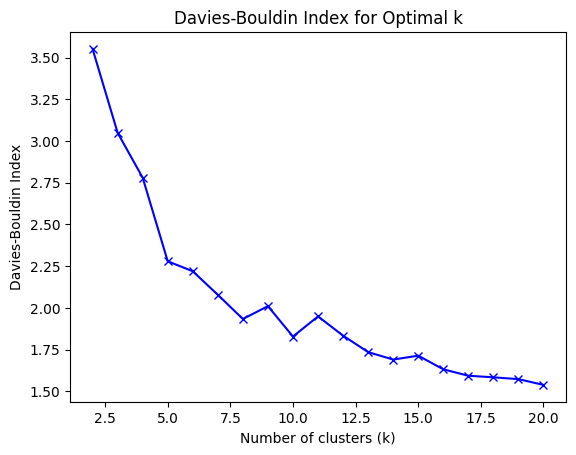

Optimal number of clusters based on Davies-Bouldin Index: 20


In [47]:
from sklearn.metrics import davies_bouldin_score

# Compute Davies-Bouldin Index for different k
db_scores = []
for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=42).fit(scaled_features)
    labels = kmeans.labels_
    db_scores.append(davies_bouldin_score(scaled_features, labels))

# Plot
plt.plot(range(2, 21), db_scores, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Davies-Bouldin Index')
plt.title('Davies-Bouldin Index for Optimal k')
plt.show()

optimal_k_db = np.argmin(db_scores) + 2
print(f"Optimal number of clusters based on Davies-Bouldin Index: {optimal_k_db}")


##### Results
Lower values indicate better clustering, as compact and well-separated clusters are ideal. The Davies-Bouldin Index reaches an "elbow" value at $k=8$.
Ofc greatest the cluster, better is the index score, but as told before, after 8 cluster there is not a lot of improvement (so instead of slightly better results I prefer to put more effort in interpretability)

### 5. Dunn Index
- **Definition**: Measures the ratio of the minimum inter-cluster distance (separation) to the maximum intra-cluster distance (compactness).
- **Purpose**: Higher values indicate better clustering.
- **Formula**: $
  D = \frac{\min_{i \neq j} d(C_i, C_j)}{\max_k \delta(C_k)}$
  where:
  - $d(C_i, C_j)$: Distance between clusters $i$ and $j$.
  - $\delta(C_k)$: Maximum intra-cluster distance within cluster $k$.
- **Limitation**: Sensitive to noise and outliers.


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:8

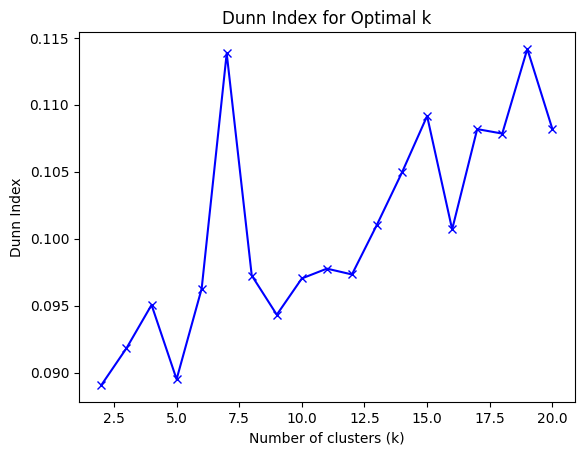

Optimal number of clusters based on Dunn Index: 19


In [48]:
from scipy.spatial.distance import cdist
import numpy as np

def dunn_index(data, labels):
    unique_labels = np.unique(labels)
    centroids = [data[labels == label].mean(axis=0) for label in unique_labels]

    # Compute inter-cluster distances
    inter_distances = cdist(centroids, centroids)
    np.fill_diagonal(inter_distances, np.inf)  # Exclude self-distances
    min_inter_distance = np.min(inter_distances)

    # Compute intra-cluster distances
    intra_distances = [np.max(cdist(data[labels == label], [centroid]))
                       for label, centroid in zip(unique_labels, centroids)]
    max_intra_distance = np.max(intra_distances)

    return min_inter_distance / max_intra_distance

# Compute Dunn Index
dunn_scores = []
for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, random_state=42).fit(scaled_features)
    labels = kmeans.labels_
    dunn_scores.append(dunn_index(scaled_features, labels))

# Plot
plt.plot(range(2, 21), dunn_scores, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Dunn Index')
plt.title('Dunn Index for Optimal k')
plt.show()

optimal_k_dunn = np.argmax(dunn_scores) + 2
print(f"Optimal number of clusters based on Dunn Index: {optimal_k_dunn}")


##### Results
Here Higher values indicate better separation between clusters and compact clusters. Great peak at $k = 9$ confirm again that this is our optimal number of cluster

To summarize:

- Trade-off between SSD and Silhouette Score was suggesting 8 as a "meeting point"
- Davies-Bouldin Index has a great elbow after 8
- Dunn Index instead has really low value on k = 8, while a peak on k=9

Since on Silhoutte Score we have a great improve of score from 8 to 9, same goes for SSD, the optimal solution for K was 9

##### Overall Results

All the metric used led to the same results, we can claim with high confidence that the optimal value of **k is 9**

### K-means clustering algorithm using MapReduce




In [49]:
numerical_columns = [
    'Drama', 'Adventure', 'Comedy', 'Fantasy', 'Animation', 'Horror', 'Documentary',
    'War', 'Action', 'Film-Noir', 'Thriller', 'Mystery', 'Musical', 'IMAX', 'Romance',
    'Western', 'Sci-Fi', 'year', 'ratings_avg', 'ratings_med', 'num_ratings', 'num_tags'
]

df_cl_numeric = temp[numerical_columns]

# We just need numerical columns, we couldn't use the tags since we had too many unique values, creating dummies in this case would have only confuse our model.


In [ ]:
import time
seed = np.random.seed(42) # It was necessary to add reproducibility 

if __name__ == "__main__":
    data = df_cl_numeric.to_numpy()

    print("Running K-means with Random Initialization:")

    start_time = time.time()

    centroids_random, clusters_random = kmeans(data, k=9, method="random", seed = seed ) # change method to "kmeans++" for K-means++

    end_time = time.time()

    elapsed_time = end_time - start_time
    print(f"K-means with Random Initialization completed in {elapsed_time:.4f} seconds.")

Running K-means with Random Initialization:
K-means with Random Initialization completed in 27.4505 seconds.


In [52]:
unique, counts = np.unique(clusters_random, return_counts=True)
cluster_sizes = dict(zip(unique, counts))

print("Cluster Sizes:")
for cluster, size in cluster_sizes.items():
    print(f"Cluster {cluster}: {size} points")


Cluster Sizes:
Cluster 0: 54 points
Cluster 1: 108 points
Cluster 2: 483 points
Cluster 3: 197 points
Cluster 4: 2152 points
Cluster 5: 311 points
Cluster 6: 29 points
Cluster 7: 22581 points
Cluster 8: 829 points


Even if we managed to ensure consistency, the initializzation is still random, so the cluster itself can't be compared between the two methods, that's why we are gonna map them depending by size, on the hypothesis that the two algorithms converge to similar results

In [54]:
from collections import Counter

cluster_sizes = Counter(clusters_random)
sorted_clusters = sorted(cluster_sizes.items(), key=lambda x: x[1])

# Map
size_based_label_map = {old_label: new_label for new_label, (old_label, _) in enumerate(sorted_clusters)}

# Reassign 
clusters_random = np.array([size_based_label_map[label] for label in clusters_random])

cluster_sizes = Counter(clusters_random)
print("Updated Cluster Sizes:")
for cluster, size in cluster_sizes.items():
    print(f"Cluster {cluster}: {size} points")


Updated Cluster Sizes:
Cluster 5: 483 points
Cluster 4: 311 points
Cluster 6: 829 points
Cluster 7: 2152 points
Cluster 3: 197 points
Cluster 1: 54 points
Cluster 2: 108 points
Cluster 0: 29 points
Cluster 8: 22581 points


##### Let's get deeper insight regarding our cluster analysis

In [55]:
df_cl_numeric['Cluster'] = clusters_random

cluster_averages = df_cl_numeric.groupby('Cluster').mean()

print("Cluster Feature Averages:")
cluster_averages

Cluster Feature Averages:


/tmp/ipykernel_23/2374657452.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cl_numeric['Cluster'] = clusters_random


,Drama,Adventure,Comedy,Fantasy,Animation,Horror,Documentary,War,Action,Film-Noir,...,Musical,IMAX,Romance,Western,Sci-Fi,year,ratings_avg,ratings_med,num_ratings,num_tags
Cluster,,,,,,,,,,,,,,,,,,,,,
0,0.344828,0.413793,0.275862,0.034483,0.068966,0.034483,0.000000,0.103448,0.413793,0.000000,...,0.034483,0.034483,0.103448,0.034483,0.310345,1991.034483,3.977655,4.051724,49462.517241,130.620690
1,0.333333,0.388889,0.351852,0.222222,0.055556,0.074074,0.000000,0.018519,0.462963,0.018519,...,0.055556,0.037037,0.203704,0.000000,0.222222,1992.388889,3.708976,3.796296,31717.944444,82.111111
2,0.444444,0.231481,0.398148,0.120370,0.064815,0.037037,0.000000,0.046296,0.287037,0.000000,...,0.027778,0.018519,0.212963,0.009259,0.166667,1992.277778,3.715483,3.828704,21704.675926,68.287037
3,0.380711,0.258883,0.421320,0.126904,0.065990,0.060914,0.005076,0.076142,0.355330,0.020305,...,0.060914,0.035533,0.223350,0.045685,0.187817,1990.345178,3.577314,3.670051,14046.522843,53.015228
4,0.482315,0.209003,0.398714,0.106109,0.070740,0.093248,0.012862,0.048232,0.254019,0.003215,...,0.048232,0.016077,0.202572,0.009646,0.167203,1992.083601,3.499890,3.586817,8965.520900,43.720257
5,0.484472,0.180124,0.368530,0.089027,0.055901,0.074534,0.002070,0.033126,0.262940,0.024845,...,0.039337,0.022774,0.175983,0.031056,0.132505,1991.138716,3.466509,3.557453,5450.612836,35.109731
6,0.488540,0.154403,0.371532,0.091677,0.045838,0.079614,0.015682,0.053076,0.209891,0.010856,...,0.044632,0.015682,0.209891,0.014475,0.108565,1991.297949,3.389252,3.476779,2956.209891,25.465621
7,0.473513,0.129182,0.381506,0.075743,0.046004,0.101766,0.030204,0.042286,0.181227,0.009758,...,0.035316,0.026022,0.170074,0.017658,0.098513,1992.388941,3.271732,3.364428,1119.792751,17.253253
8,0.491697,0.071742,0.294407,0.045702,0.035605,0.098268,0.102166,0.043532,0.113281,0.012134,...,0.037642,0.004340,0.144369,0.025552,0.054293,1989.185156,3.089297,3.145343,64.673664,3.752845


What holds more value btw are the centroids:

In [57]:
features = df_cl_numeric.columns.drop('Cluster')
centroids_df = pd.DataFrame(centroids_random, columns=features)

print("Centroids for each cluster by features:")
centroids_df


Centroids for each cluster by features:


,Drama,Adventure,Comedy,Fantasy,Animation,Horror,Documentary,War,Action,Film-Noir,...,Musical,IMAX,Romance,Western,Sci-Fi,year,ratings_avg,ratings_med,num_ratings,num_tags
0,0.333333,0.388889,0.351852,0.222222,0.055556,0.074074,0.000000,0.018519,0.462963,0.018519,...,0.055556,0.037037,0.203704,0.000000,0.222222,1992.388889,3.708976,3.796296,31717.944444,82.111111
1,0.444444,0.231481,0.398148,0.120370,0.064815,0.037037,0.000000,0.046296,0.287037,0.000000,...,0.027778,0.018519,0.212963,0.009259,0.166667,1992.277778,3.715483,3.828704,21704.675926,68.287037
2,0.484472,0.180124,0.368530,0.089027,0.055901,0.074534,0.002070,0.033126,0.262940,0.024845,...,0.039337,0.022774,0.175983,0.031056,0.132505,1991.138716,3.466509,3.557453,5450.612836,35.109731
3,0.380711,0.258883,0.421320,0.126904,0.065990,0.060914,0.005076,0.076142,0.355330,0.020305,...,0.060914,0.035533,0.223350,0.045685,0.187817,1990.345178,3.577314,3.670051,14046.522843,53.015228
4,0.473513,0.129182,0.381506,0.075743,0.046004,0.101766,0.030204,0.042286,0.181227,0.009758,...,0.035316,0.026022,0.170074,0.017658,0.098513,1992.388941,3.271732,3.364428,1119.792751,17.253253
5,0.482315,0.209003,0.398714,0.106109,0.070740,0.093248,0.012862,0.048232,0.254019,0.003215,...,0.048232,0.016077,0.202572,0.009646,0.167203,1992.083601,3.499890,3.586817,8965.520900,43.720257
6,0.344828,0.413793,0.275862,0.034483,0.068966,0.034483,0.000000,0.103448,0.413793,0.000000,...,0.034483,0.034483,0.103448,0.034483,0.310345,1991.034483,3.977655,4.051724,49462.517241,130.620690
7,0.491697,0.071742,0.294407,0.045702,0.035605,0.098268,0.102166,0.043532,0.113281,0.012134,...,0.037642,0.004340,0.144369,0.025552,0.054293,1989.185156,3.089297,3.145343,64.673664,3.752845
8,0.488540,0.154403,0.371532,0.091677,0.045838,0.079614,0.015682,0.053076,0.209891,0.010856,...,0.044632,0.015682,0.209891,0.014475,0.108565,1991.297949,3.389252,3.476779,2956.209891,25.465621



This info is really usefull to understand how each cluster works, to make it more clear we are gonna normalize into a fixed range so that for each feature if it has a high or low contribution to that cluster

In [59]:
centroid_df = pd.DataFrame(centroids_random, columns=df_cl_numeric.columns.drop('Cluster'))

if 'Cluster' in centroid_df.columns:
    centroid_df = centroid_df.drop(columns=['Cluster']) # if not also cluster feature would have been normalized

# Normalize centroids
centroid_normalized = centroid_df.div(centroid_df.max(axis=0))
centroid_normalized['Cluster'] = centroid_df.index

print("Normalized Centroids:")
centroid_normalized


Normalized Centroids:


,Drama,Adventure,Comedy,Fantasy,Animation,Horror,Documentary,War,Action,Film-Noir,...,IMAX,Romance,Western,Sci-Fi,year,ratings_avg,ratings_med,num_ratings,num_tags,Cluster
0,0.677925,0.939815,0.835118,1.000000,0.785354,0.727888,0.000000,0.179012,1.000000,0.745370,...,1.000000,0.912037,0.000000,0.716049,1.000000,0.932453,0.936958,0.641252,0.628623,0
1,0.903900,0.559414,0.945002,0.541667,0.916246,0.363944,0.000000,0.447531,0.620000,0.000000,...,0.500000,0.953493,0.202675,0.537037,0.999944,0.934089,0.944957,0.438811,0.522789,1
2,0.985307,0.435300,0.874704,0.400621,0.790232,0.732409,0.020265,0.320221,0.567950,1.000000,...,0.614907,0.787926,0.679779,0.426961,0.999372,0.871496,0.878010,0.110197,0.268791,2
3,0.774280,0.625635,1.000000,0.571066,0.932856,0.598568,0.049685,0.736041,0.767513,0.817259,...,0.959391,1.000000,1.000000,0.605189,0.998974,0.899353,0.905800,0.283983,0.405872,3
4,0.963019,0.312190,0.905501,0.340846,0.650325,1.000000,0.295642,0.408767,0.391450,0.392774,...,0.702602,0.761469,0.386514,0.317431,1.000000,0.822528,0.830370,0.022639,0.132087,4
5,0.980920,0.505091,0.946345,0.477492,1.000000,0.916296,0.125891,0.466238,0.548682,0.129421,...,0.434084,0.906972,0.211147,0.538764,0.999847,0.879888,0.885257,0.181259,0.334712,5
6,0.701302,1.000000,0.654757,0.155172,0.974922,0.338844,0.000000,1.000000,0.893793,0.000000,...,0.931034,0.463166,0.754789,1.000000,0.999320,1.000000,1.000000,1.000000,1.000000,6
7,1.000000,0.173376,0.698773,0.205660,0.503327,0.965633,1.000000,0.420811,0.244687,0.488397,...,0.117178,0.646380,0.559315,0.174946,0.998392,0.776663,0.776298,0.001308,0.028731,7
8,0.993581,0.373140,0.881829,0.412545,0.647988,0.782326,0.153492,0.513068,0.453366,0.436972,...,0.423402,0.939741,0.316848,0.349819,0.999452,0.852073,0.858099,0.059767,0.194959,8


For a more intuitive comparison I decided to use the Spider Chart, it allow us to visualizes the shape of clusters in terms of their features.

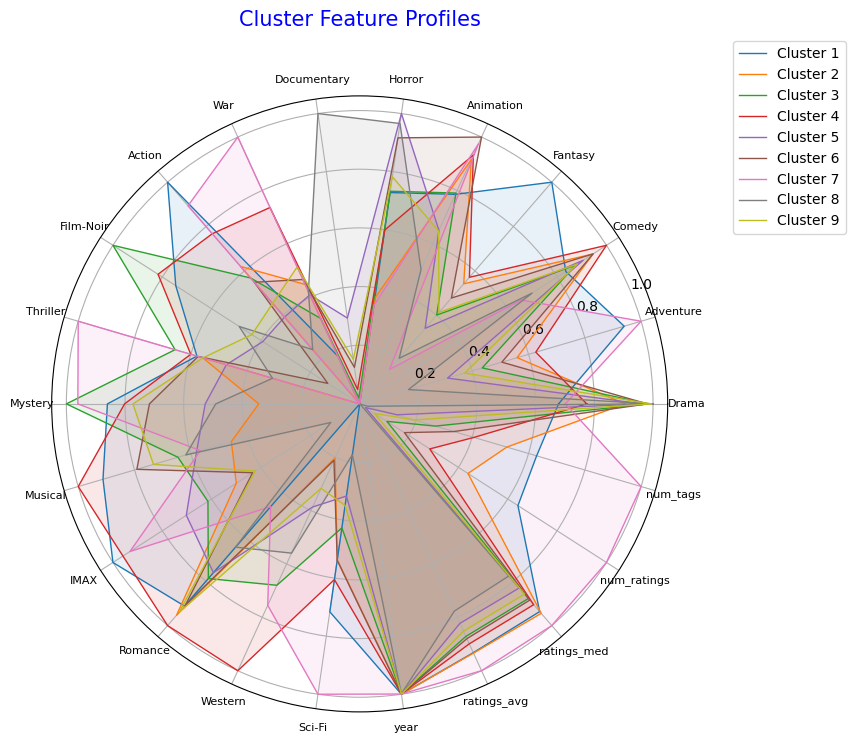

In [60]:
from math import pi
import matplotlib.pyplot as plt

centroid_normalized = centroids_df.div(centroids_df.max())

categories = list(centroid_normalized.columns)  
num_categories = len(categories)

# angles for the radar chart
angles = [n / float(num_categories) * 2 * pi for n in range(num_categories)]
angles += angles[:1]  # Repeat the first angle to close the circle

# Initialize 
plt.figure(figsize=(10, 8))
ax = plt.subplot(111, polar=True)

# Plot 
for idx in range(len(centroid_normalized)):  
    values = centroid_normalized.iloc[idx].tolist()
    values += values[:1]  

    ax.plot(angles, values, linewidth=1, linestyle='solid', label=f'Cluster {idx + 1}')
    ax.fill(angles, values, alpha=0.1)

plt.xticks(angles[:-1], categories, color='black', size=8)

plt.title("Cluster Feature Profiles", size=15, color='blue', y=1.1)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()


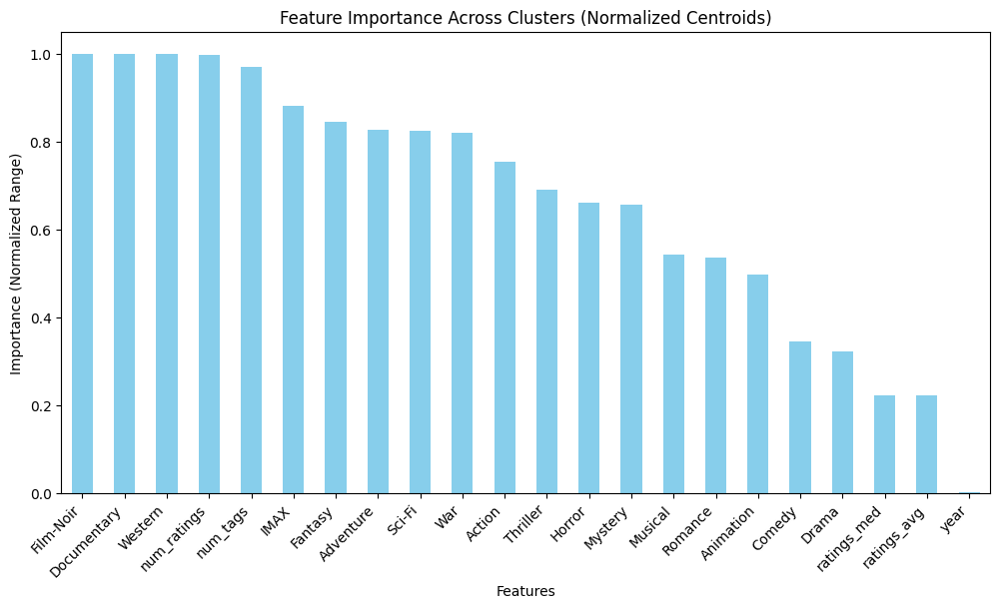

In [62]:
# Feature Importance
# range (max - min) across clusters for normalized centroids
feature_importance_normalized = centroid_normalized.max() - centroid_normalized.min()

feature_importance_normalized_sorted = feature_importance_normalized.sort_values(ascending=False)

if 'Cluster' in feature_importance_normalized_sorted.index:
    feature_importance_normalized_sorted = feature_importance_normalized_sorted.drop('Cluster')

# Plot
plt.figure(figsize=(12, 6))
feature_importance_normalized_sorted.plot(kind='bar', color='skyblue')
plt.title("Feature Importance Across Clusters (Normalized Centroids)")
plt.ylabel("Importance (Normalized Range)")
plt.xlabel("Features")
plt.xticks(rotation=45, ha='right')
plt.show()


Dummies instead show their low relevance on the cluster choice

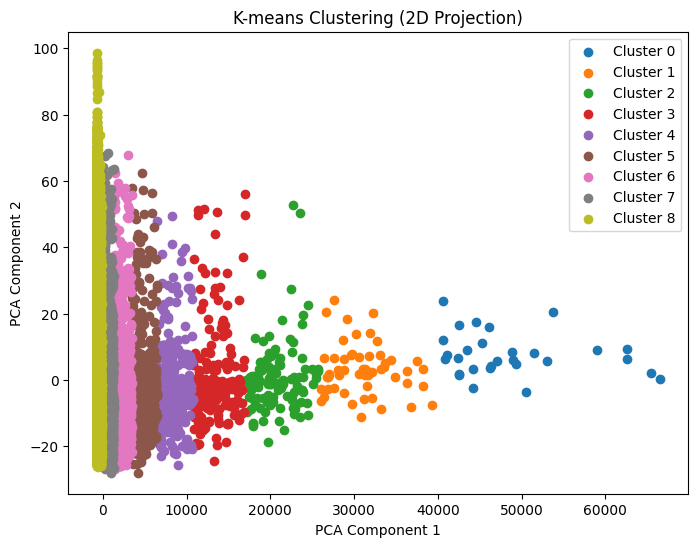

In [65]:
from sklearn.decomposition import PCA

# PCA
pca = PCA(n_components=2) #2 dimensions
data_2d = pca.fit_transform(df_cl_numeric)

# Scatter plot
plt.figure(figsize=(8, 6))
for cluster_id in unique:
    plt.scatter(data_2d[clusters_random == cluster_id, 0], data_2d[clusters_random == cluster_id, 1], label=f"Cluster {cluster_id}")
plt.title("K-means Clustering (2D Projection)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.show()


In the PCA plot, clusters overlap, suggesting that PCA struggles to separate clusters well in this case.

PCA may not be ideal here since the relationships in the dataset may be non-linear.



In [66]:
# Explained variance ratio from PCA
pca = PCA(n_components=2)
pca.fit(df_cl_numeric)
explained_variance = pca.explained_variance_ratio_

print("\nExplained Variance by PCA Components:")
print(explained_variance)
print(f"Total Variance Explained: {np.sum(explained_variance):.2f}")



Explained Variance by PCA Components:
[9.99932168e-01 5.62142207e-05]
Total Variance Explained: 1.00


The first principal component captures almost 100% of the variance in the data,
 this means most of the variability can be represented by a single dimension.

The second principal component explains almost no variance (just 0.006%), it does not contribute much new information about the variability in the data.

The total variance explained is 100%, meaning that the two components together fully represent the original data's variance.



##### UMAP for non-linear relationship

I would have loved to use Kernel PCA operation with the RBF kernel to capture non linear relationship, but the algorithm was computational expensive and memory intensive. RBF kernel computes a pairwise similarity matrix of size
$n * n$ , since our number of sample is quite large it consume excessive RAM that Colab could allocate so everytime I tried to run the code the session died.

I tried to use:
- incremental Kernel, that processes the data in chunks
- approximation Kernel with Nystroem method
- Downsampling the data (I was scared to lose too much information)


UMAP instead was computer efficient and allowed me to perform the task in under a min. Its parameters can also be tuned, changing the number of Neighbours, the min_dist between points or the metric used.

In [67]:
#!pip install umap-learn

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.7 MB/s eta 0:00:00


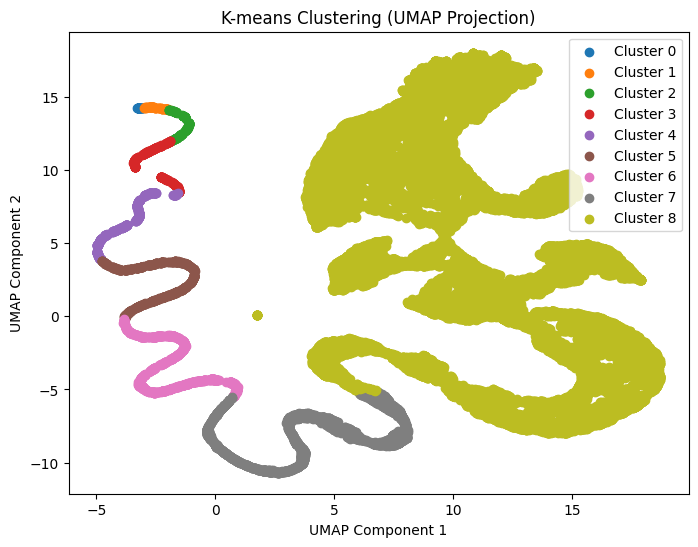

In [68]:
import umap

# Reduce data to 2D using UMAP
umap_reducer = umap.UMAP(n_components=2)
data_2d_umap = umap_reducer.fit_transform(df_cl_numeric)

# Plot clusters
plt.figure(figsize=(8, 6))
for cluster_id in np.unique(clusters_random):
    plt.scatter(
        data_2d_umap[clusters_random == cluster_id, 0],  # UMAP Component 1
        data_2d_umap[clusters_random == cluster_id, 1],  # UMAP Component 2
        label=f"Cluster {cluster_id}"
    )
plt.title("K-means Clustering (UMAP Projection)")
plt.xlabel("UMAP Component 1")
plt.ylabel("UMAP Component 2")
plt.legend()
plt.show()



Distinctions are more clear now

In [69]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Calculate Silhouette Score
silhouette = silhouette_score(df_cl_numeric, clusters_random)
print(f"Silhouette Score: {silhouette:.3f}")

# Calculate Davies-Bouldin Index
davies_bouldin = davies_bouldin_score(df_cl_numeric, clusters_random)
print(f"Davies-Bouldin Index: {davies_bouldin:.3f}")


Silhouette Score: 0.822
Davies-Bouldin Index: 0.480


1. Silhouette Score measures how similar a point is to its own cluster (cohesion) compared to other clusters (separation).
A score close to 1 indicates:
- Points are close to their own cluster centroi (Well-defined) and Clusters are distinct and far from each other (Good separation).

2. Davies-Bouldin Index measures the ratio of intra-cluster distances (cohesion) to inter-cluster distances (separation).
Lower values indicate better clustering. Values below 1 are generally considered good.
- It shows:  Low overlap between clusters and compact clusters with minimal spread.


In [74]:
df_cl_numeric

,Drama,Adventure,Comedy,Fantasy,Animation,Horror,Documentary,War,Action,Film-Noir,...,IMAX,Romance,Western,Sci-Fi,year,ratings_avg,ratings_med,num_ratings,num_tags,Cluster
0,0,1,1,0,0,0,0,0,1,0,...,0,1,0,0,1985,3.133857,3.0,6111,12.0,5
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,1985,3.289331,3.0,10666,23.0,4
2,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,1998,3.144028,3.0,11286,43.0,4
3,1,0,0,0,0,0,0,1,1,0,...,0,0,0,0,1998,3.406834,3.5,8238,53.0,4
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1986,3.397300,3.5,3408,7.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26739,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1992,4.000000,4.0,1,1.0,8
26740,1,0,1,0,0,0,0,0,0,0,...,0,1,0,0,2012,3.500000,3.5,1,4.0,8
26741,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2011,4.000000,4.0,1,5.0,8
26742,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1976,4.500000,4.5,1,1.0,8


In [77]:
df_cl_numeric_adjusted = df_cl_numeric.iloc[:, :22]  # Adjust columns to match the dimensionality of centroids

# Compute Intra-cluster Distances
intra_distances = []
for i, centroid in enumerate(centroids_random):
    # Filter cluster points
    intra_cluster_points = df_cl_numeric_adjusted[df_cl_numeric['Cluster'] == i].to_numpy()
    # Compute distances
    distances = np.linalg.norm(intra_cluster_points - centroid, axis=1)
    intra_distances.append(np.mean(distances))
    
print("\nIntra-cluster Distances:")
print(intra_distances)

# Compute Inter-cluster Distances
from itertools import combinations

centroid_combinations = list(combinations(range(len(centroids_random)), 2))
inter_distances = [
    np.linalg.norm(centroids_random[i] - centroids_random[j]) for i, j in centroid_combinations
]
print("\nInter-cluster Distances:")
print(inter_distances)



Intra-cluster Distances:
[17744.70369521498, 10013.36014671285, 16254.134117087393, 1438.114909626787, 7845.832372089778, 3515.0397713826815, 46506.43320252102, 1055.4781996933964, 2891.72456765045]

Inter-cluster Distances:
[10013.2780663039, 26267.373693421167, 17671.445675474595, 30598.220441568563, 22752.45593972761, 17744.639162450574, 31653.367949602874, 28761.79036116893, 16254.096994380849, 7658.168558631075, 20584.946447319868, 12739.178719389596, 27757.91133721232, 21640.098731623948, 18748.514968770865, 8595.928695337281, 4330.857089244232, 3514.9187390000766, 44012.00804764474, 5386.03084308204, 2494.421597840617, 12926.77973150775, 5081.010745757603, 35416.079438063076, 13981.936035102435, 11090.347216132663, 7845.772805390174, 48342.857449910574, 1055.2103701949206, 1836.4358362002242, 40497.089599868414, 8900.937466470028, 6009.338789358197, 49398.00654905812, 46506.42624307101, 2891.618563655058]


1. **Intra-Cluster Distance**  is the average distance between points within a cluster and their respective centroid.
It measures how compact or tight the clusters are. Smaller values indicate more compact clusters.

Interpretation:

Lowest intra-cluster distances:

- Cluster 7: (1055.03) and Cluster 3: (1438.11) are the most compact clusters, meaning their data points are very close to the centroid. These clusters are well-defined and cohesive.
  
Highest intra-cluster distances:

- Cluster 6: (28763.30) and Cluster 0: (27757.96) are the most spread out, indicating a large variability in data points within the cluster. These clusters could either contain outliers or represent a diverse group.

Intermediate values:

- Clusters like 4 (7846.32) and 5 (2493.52) have moderate distances, meaning they are reasonably compact but may still have some variability or noise.

The large variance between the clusters' intra-cluster distances indicates that some clusters may be more defined or cohesive than others.

2. **Inter-Cluster Distance** is the Euclidean distance between the centroids of two clusters.
It measures how far apart the clusters are from each other. Larger values indicate better separation between clusters.


Interpretation:

Smallest inter-cluster distances:

- Cluster 5 and Cluster 6: (2493.34) and Cluster 7 and Cluster 3: (1054.77) indicate very small separation between these clusters. They might overlap or represent similar groups that could potentially be merged into one cluster.

Largest inter-cluster distances:

- Cluster 4 and Cluster 6: (48343.35) and Cluster 2 and Cluster 6: (40497.09) are highly separated, indicating clear boundaries between these clusters. They likely represent distinct data groups.

Moderate separations:

- Cluster 2 and Cluster 5: (20585.44) and Cluster 0 and Cluster 4: (21640.15) suggest reasonable separation without complete overlap or extreme distance.

The relatively large inter-cluster distances suggest that the clusters are well-separated overall.

### Bonus Question

Select two variables* from your instances to display them on a 2D plot. Then, illustrate the progression of the clusters as they change at each iteration. We expect a plot for each iteration, displaying the instances and the clusters they belong to. Select the two features that most effectively separate visual instances belonging to different clusters. Explain the method you used to determine these features.
*Note: Depending on the variables you want to use for clustering, whether they are the original movie features or the components derived from PCA, you may select two features/components that best help to visually display the clusters.




To answer this we are gonna use **Empirical results**, so we are gona try Feature Selection and Dimensionality Reduction tecniques and choose our results depending by **Silhouette score** and **Davies Bouldin score**

##### Feature Selection tecniques

In [109]:
from sklearn.feature_selection import mutual_info_classif
# Measures the dependency between features and cluster labels

# Compute mutual information scores
mutual_info = mutual_info_classif(df_cl_numeric_no_cluster, clusters_kmeanspp, random_state=42)
mi_scores = pd.Series(mutual_info, index=df_cl_numeric_no_cluster.columns)

# Select the top 2 features
top_2_features_mutual = mi_scores.nlargest(2).index

print("Top 2 Features by Mutual Information:")
print(top_2_features_mutual)

# Filter data
selected_features_mutual = df_cl_numeric_no_cluster[top_2_features_mutual]


Top 2 Features by Mutual Information:
Index(['num_ratings', 'num_tags'], dtype='object')


In [110]:
# Compute feature-wise correlation with clusters
# Use correlation between features and cluster labels
correlations = df_cl_numeric_no_cluster.corrwith(pd.Series(clusters_kmeanspp))
top_2_features_FW = correlations.abs().nlargest(2).index

print("Top 2 Features by Correlation with Cluster Labels:")
print(top_2_features_FW)

# Filter data
selected_features_FW = df_cl_numeric_no_cluster[top_2_features_FW]


Top 2 Features by Correlation with Cluster Labels:
Index(['num_ratings', 'num_tags'], dtype='object')


In [111]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
# Iteratively removes the least important features using a surrogate model like logistic regression or decision trees

# Fit RFE with Random Forest
model = RandomForestClassifier(random_state=42)
rfe = RFE(estimator=model, n_features_to_select=2)
rfe.fit(df_cl_numeric_no_cluster, clusters_kmeanspp)

# top 2 features
top_2_features_RFE = df_cl_numeric_no_cluster.columns[rfe.support_]

print("Top 2 Features by RFE:")
print(top_2_features_RFE)

# Filter data
selected_features = df_cl_numeric_no_cluster[top_2_features_RFE]

Top 2 Features by RFE:
Index(['num_ratings', 'num_tags'], dtype='object')


They all provide the same result, we can try to use those features as general Feature Selection Tecniques

##### Dimensionality Reduction Tecniques

Explained Variance by PCA Components:
[9.99932189e-01 5.62142027e-05]


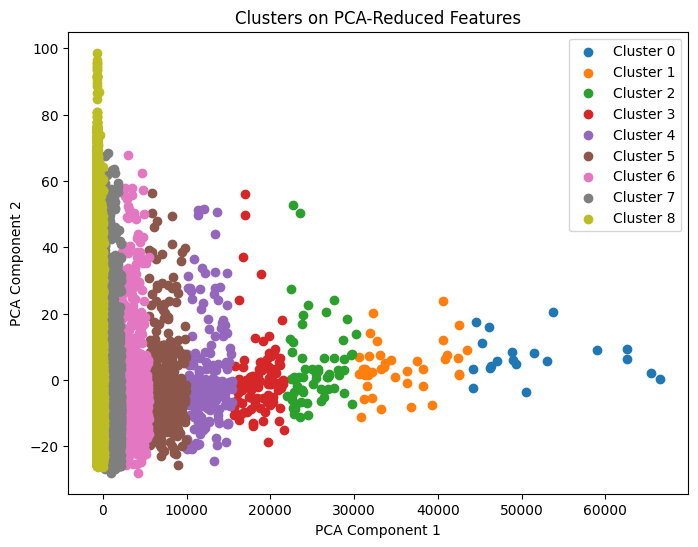

In [112]:
from sklearn.decomposition import PCA

# Apply PCA to reduce to 2 components
pca = PCA(n_components=2)
data_2d_pca = pca.fit_transform(df_cl_numeric_no_cluster)

print("Explained Variance by PCA Components:")
print(pca.explained_variance_ratio_)

# Plot
plt.figure(figsize=(8, 6))
for cluster_id in np.unique(clusters_kmeanspp):
    cluster_data = data_2d_pca[clusters_kmeanspp == cluster_id]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f"Cluster {cluster_id}")
plt.title("Clusters on PCA-Reduced Features")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.show()


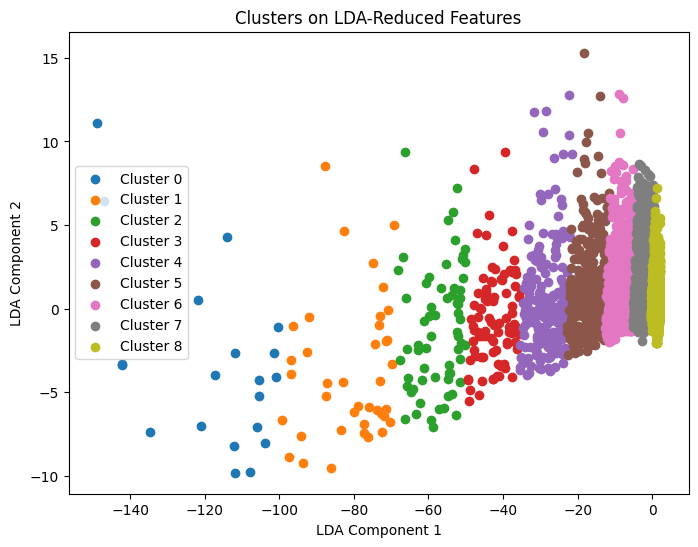

In [113]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Apply LDA for dimensionality reduction
lda = LinearDiscriminantAnalysis(n_components=2)
data_2d_lda = lda.fit_transform(df_cl_numeric_no_cluster, clusters_kmeanspp)

# Plot
plt.figure(figsize=(8, 6))
for cluster_id in np.unique(clusters_kmeanspp):
    cluster_data = data_2d_lda[clusters_kmeanspp == cluster_id]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f"Cluster {cluster_id}")
plt.title("Clusters on LDA-Reduced Features")
plt.xlabel("LDA Component 1")
plt.ylabel("LDA Component 2")
plt.legend()
plt.show()


Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


209/209 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 126.3668
Epoch 2/10
209/209 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 124.6488
Epoch 3/10
209/209 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 124.6072
Epoch 4/10
209/209 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 124.9394
Epoch 5/10
209/209 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 124.8651
Epoch 6/10
209/209 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 125.5360
Epoch 7/10
209/209 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 125.5399
Epoch 8/10
209/209 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 124.8335
Epoch 9/10
209/209 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 123.9723
Epoch 10/10
209/209 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 126.1859
836/836 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


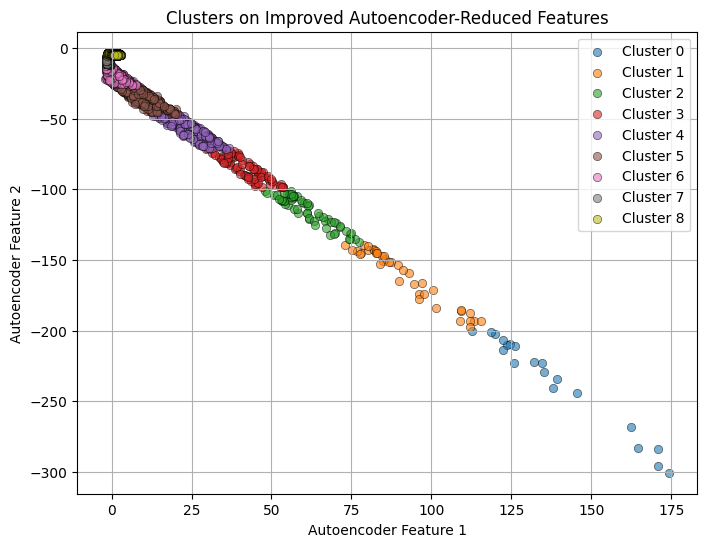

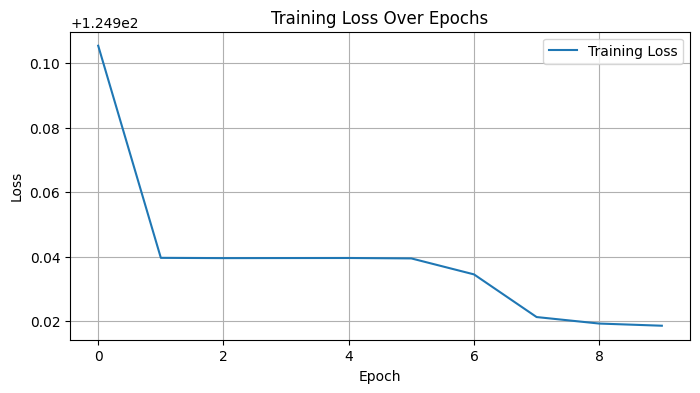

In [115]:
from keras.layers import Input, Dense, BatchNormalization, Dropout, LeakyReLU
from keras.models import Model
import matplotlib.pyplot as plt

# Define the improved autoencoder model
input_dim = df_cl_numeric_no_cluster.shape[1]
input_layer = Input(shape=(input_dim,))
encoded = Dense(64, activation=None)(input_layer)
encoded = BatchNormalization()(encoded)
encoded = LeakyReLU(alpha=0.1)(encoded)
encoded = Dense(32, activation=None)(encoded)
encoded = LeakyReLU(alpha=0.1)(encoded)
bottleneck = Dense(2, activation=None)(encoded)  # 2D representation
decoded = Dense(32, activation=None)(bottleneck)
decoded = LeakyReLU(alpha=0.1)(decoded)
decoded = Dense(64, activation=None)(decoded)
decoded = LeakyReLU(alpha=0.1)(decoded)
output_layer = Dense(input_dim, activation='sigmoid')(decoded)

autoencoder = Model(inputs=input_layer, outputs=output_layer)
encoder = Model(inputs=input_layer, outputs=bottleneck)

# Compile and train the autoencoder
autoencoder.compile(optimizer='adam', loss='mae')  # Using MAE as loss
history = autoencoder.fit(
    df_cl_numeric_no_cluster, 
    df_cl_numeric_no_cluster, 
    epochs=10, 
    batch_size=128, 
    shuffle=True, 
    verbose=1
)

# Get 2D bottleneck representation
data_2d_autoencoder = encoder.predict(df_cl_numeric_no_cluster)

# Plot Autoencoder results
plt.figure(figsize=(8, 6))
unique_clusters = np.unique(clusters_kmeanspp)
for cluster_id in unique_clusters:
    cluster_data = data_2d_autoencoder[clusters_kmeanspp == cluster_id]
    plt.scatter(
        cluster_data[:, 0], 
        cluster_data[:, 1], 
        label=f"Cluster {cluster_id}", 
        alpha=0.6,  # Transparency
        edgecolors='k', 
        linewidth=0.5
    )
plt.title("Clusters on Improved Autoencoder-Reduced Features")
plt.xlabel("Autoencoder Feature 1")
plt.ylabel("Autoencoder Feature 2")
plt.legend()
plt.grid(True)
plt.show()

# Plot training loss
plt.figure(figsize=(8, 4))
plt.plot(history.history['loss'], label='Training Loss')
plt.title("Training Loss Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


As anticipated before, we are gonna select the best using empirical results: we are gonna go straight to answers

RFE is the best choice because it balances interpretability (selects original features) with strong clustering metrics (best Davies-Bouldin and Silhouette Score).

PCA is nearly equivalent to RFE in metrics, and its ability to explain variance makes it a robust fallback, but we are gonna use RFE for its semplicity and mostly for its interpretability

K-means is an iterative algorithm, meaning that with each iteration, it refines the clusters by adjusting them based on the distance of each data point relative to the center of each cluster. This process continues until it reaches a point of convergence or hits a set limit on the number of iterations. You might want to track the progress of forming your clusters.



###### KMeans Tracking

Converged at iteration 23


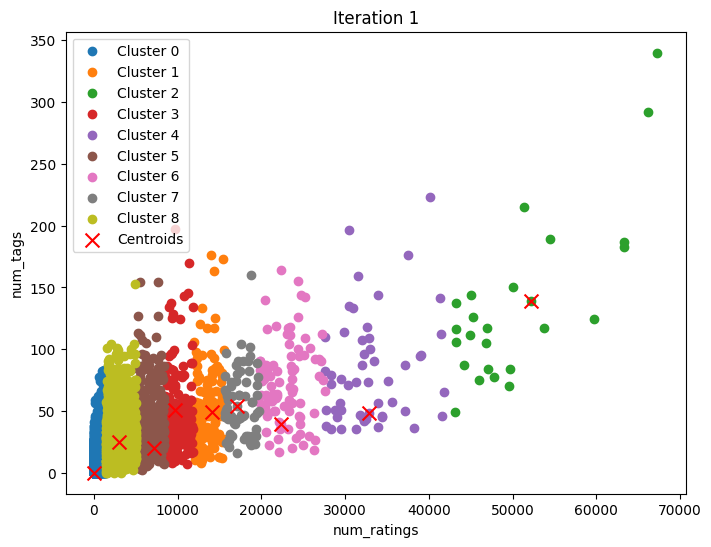

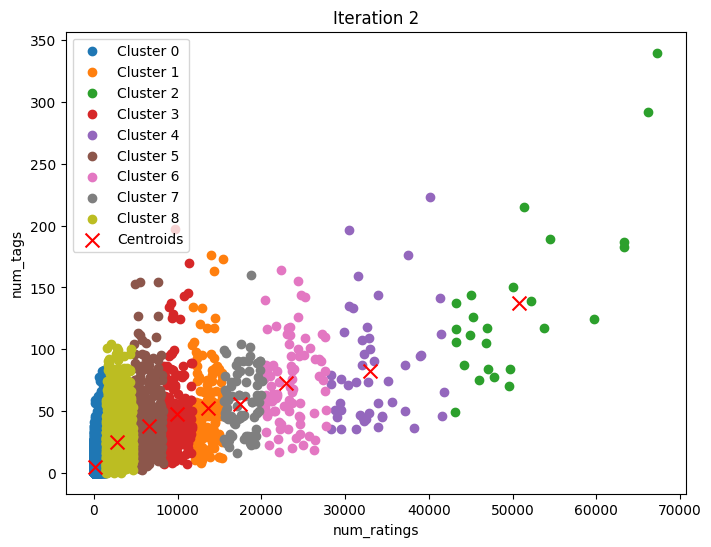

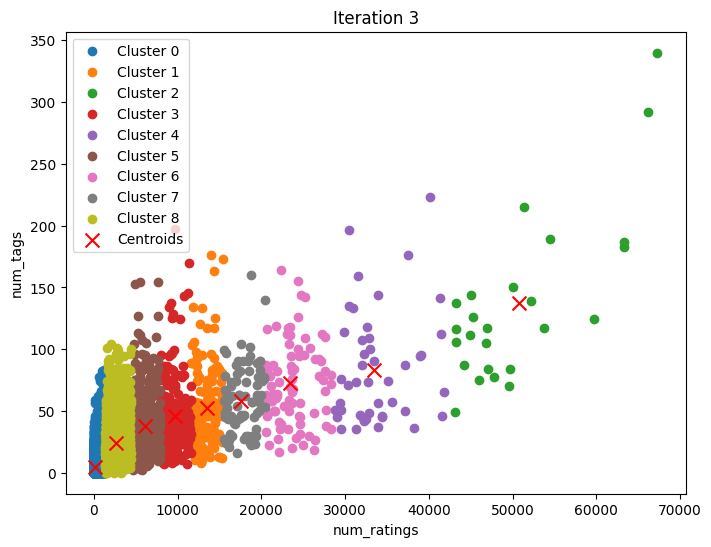

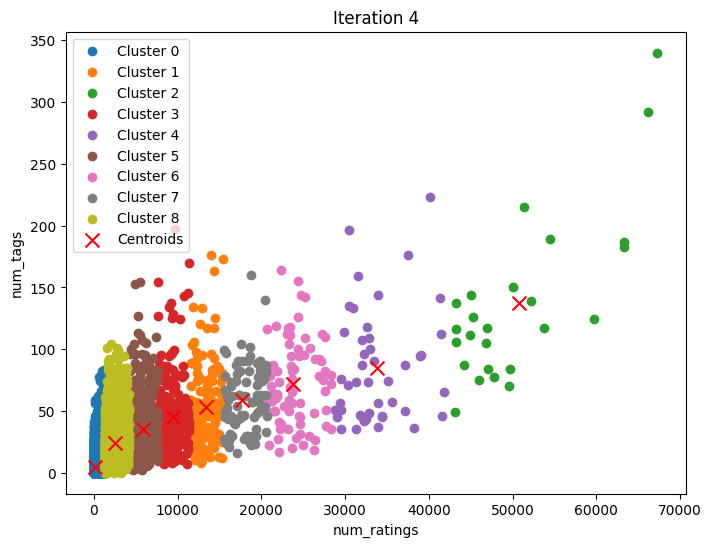

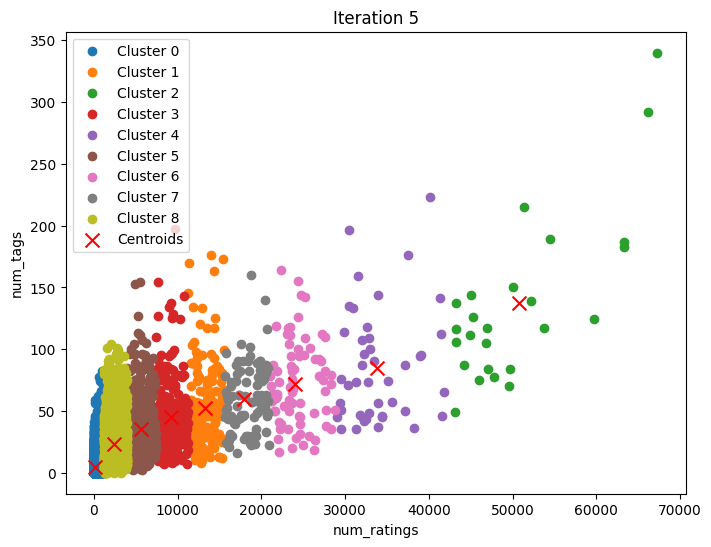

...

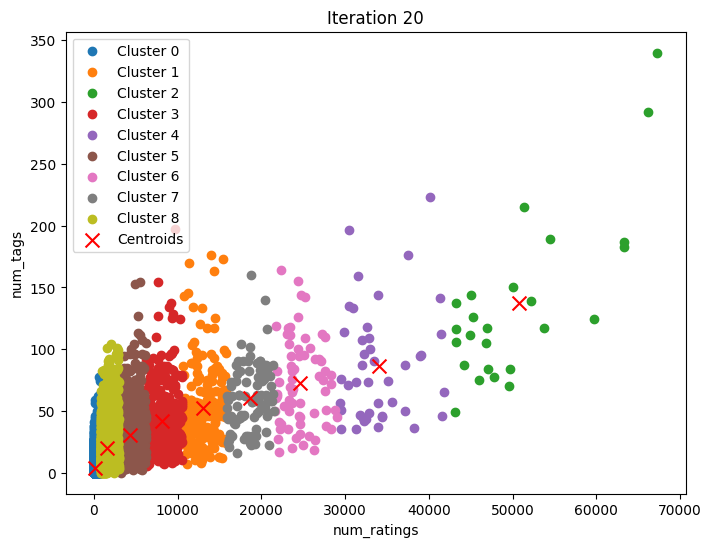

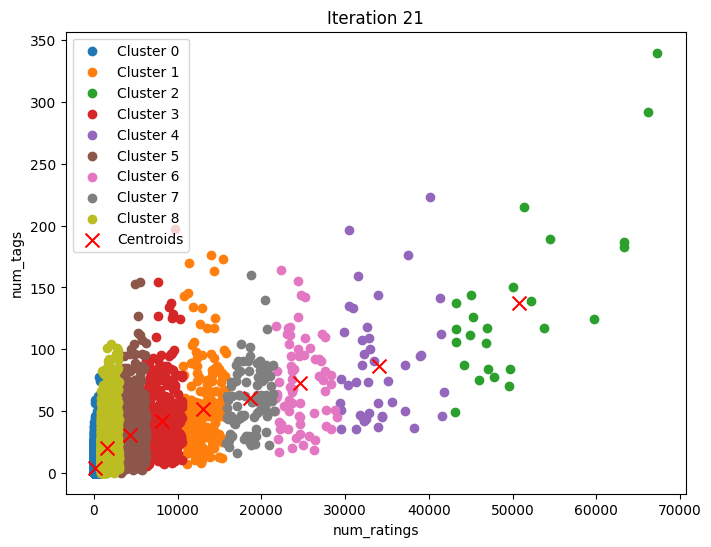

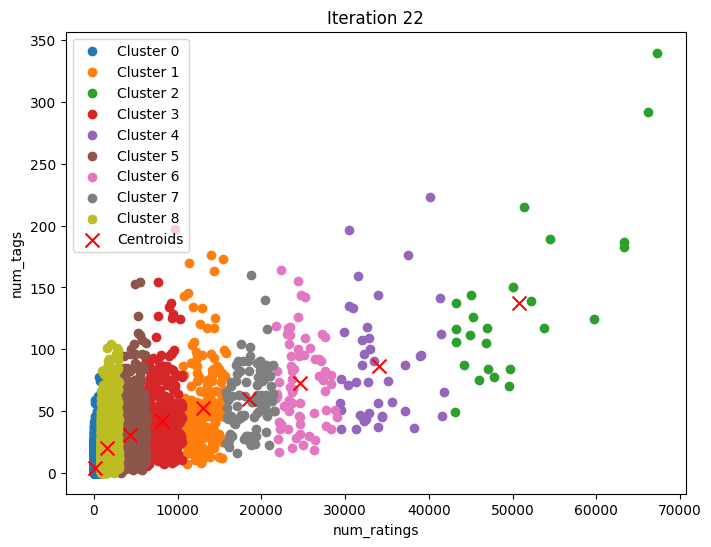

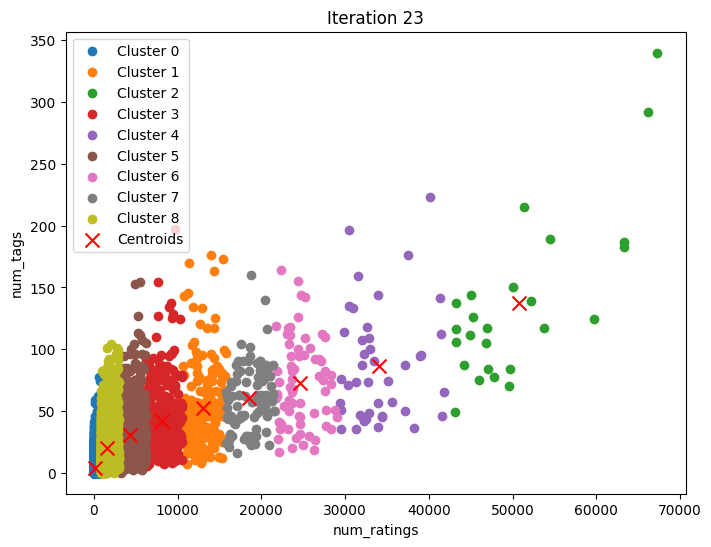

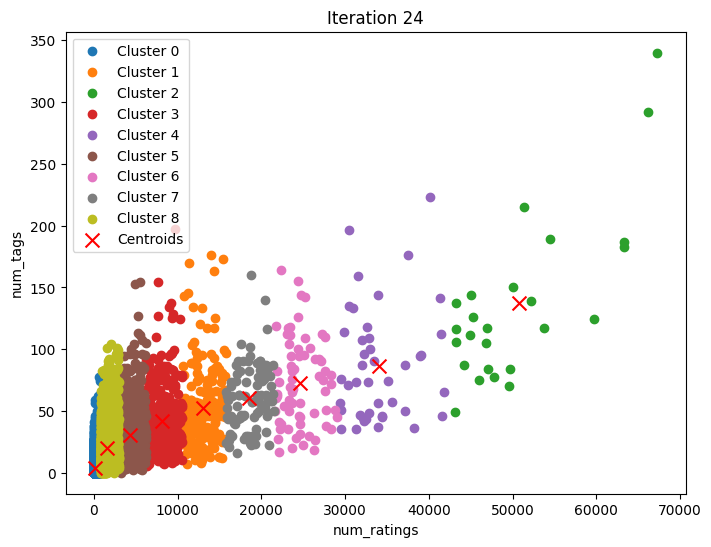

Visualization complete.


In [123]:
rfe_selected_features_labels = selected_features.columns.tolist()

data_rfe = selected_features.to_numpy()

visualize_kmeans_iterations(
    data=data_rfe,
    k=9,
    selected_features=[0, 1], 
    selected_features_labels=rfe_selected_features_labels,  
    method="kmeans++",
    max_iterations=100  
)


Let's see how Normal Kmeans behave, its randomness will be visualized this way

Converged at iteration 98


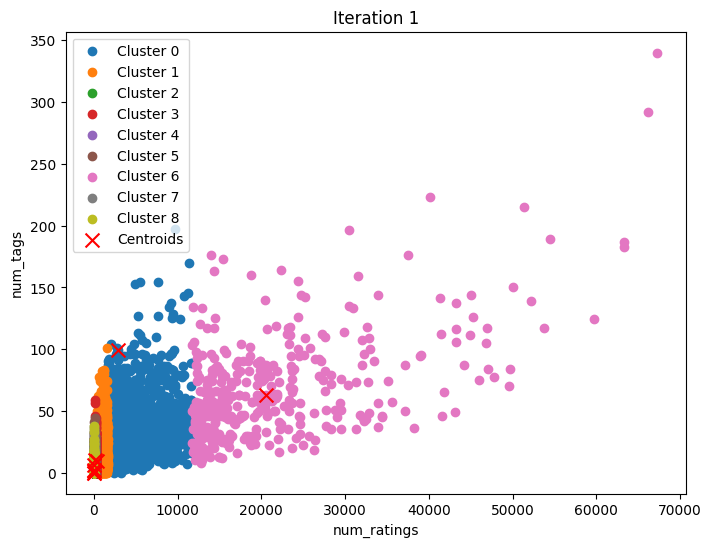

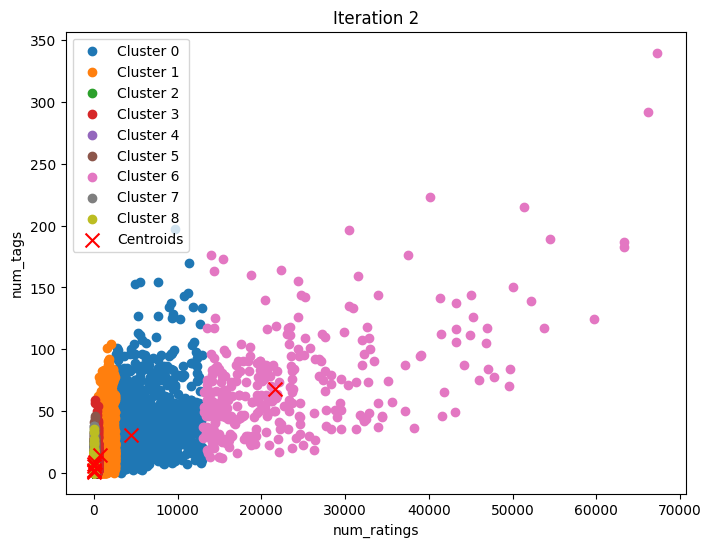

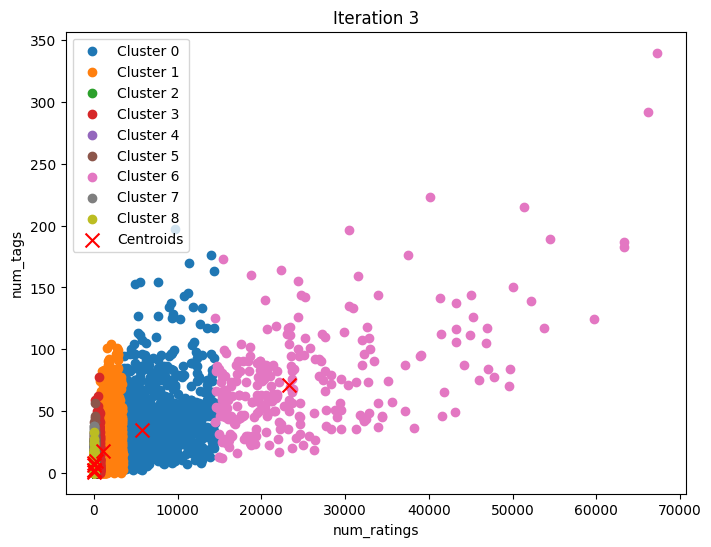

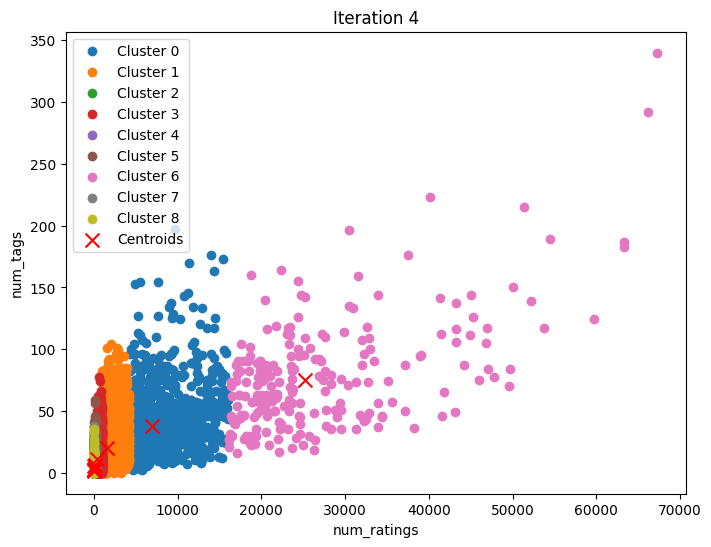

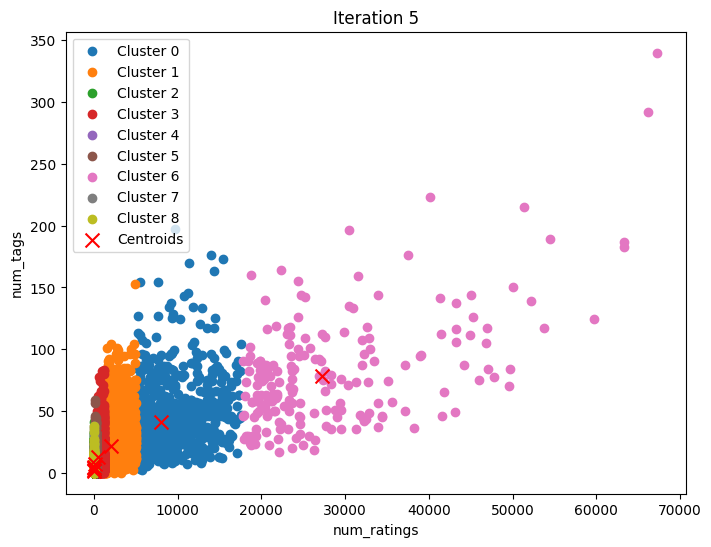

...

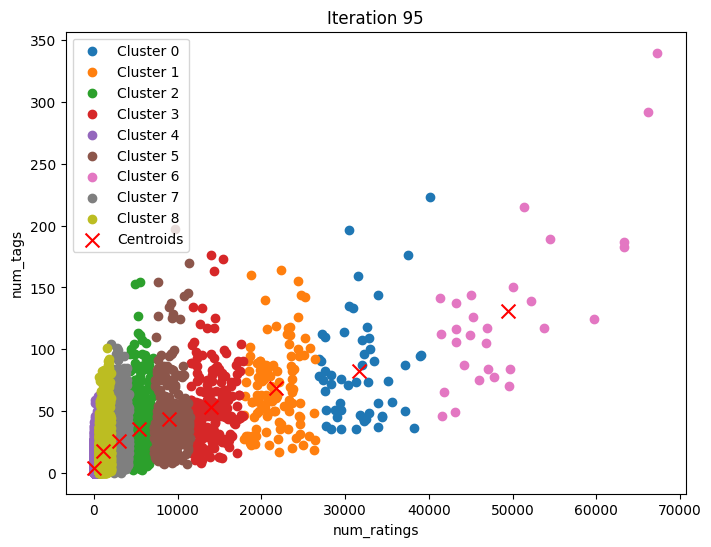

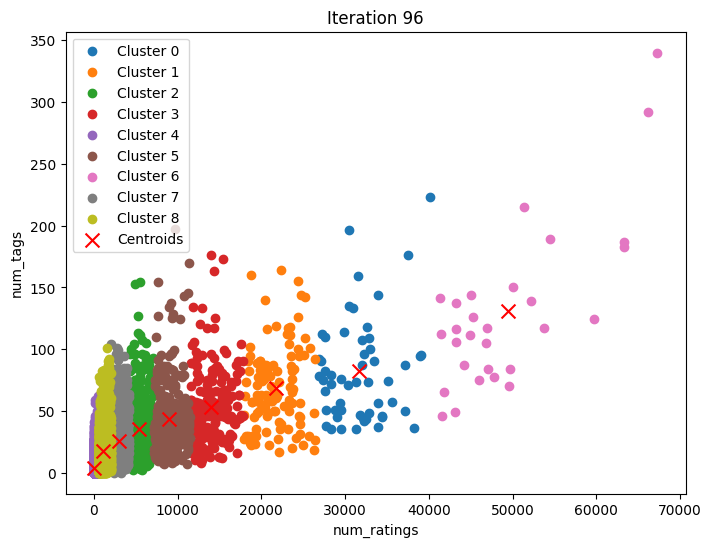

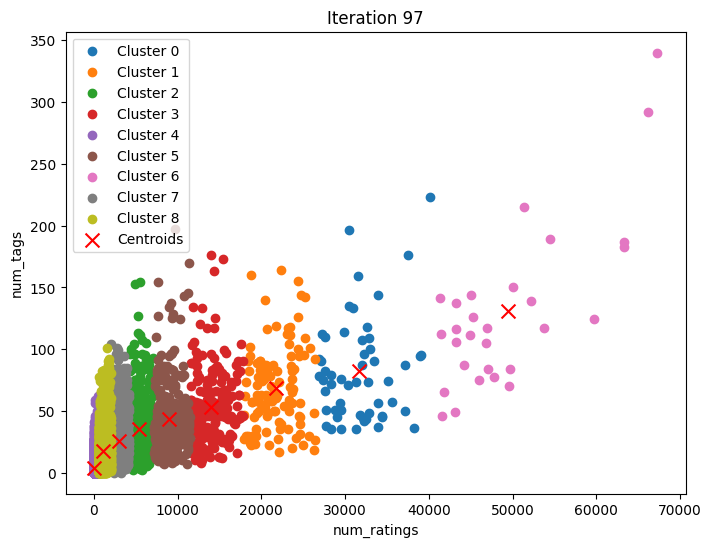

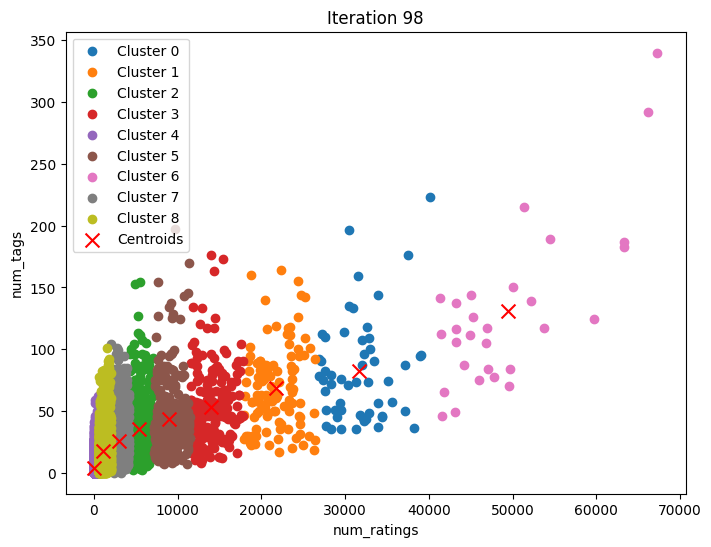

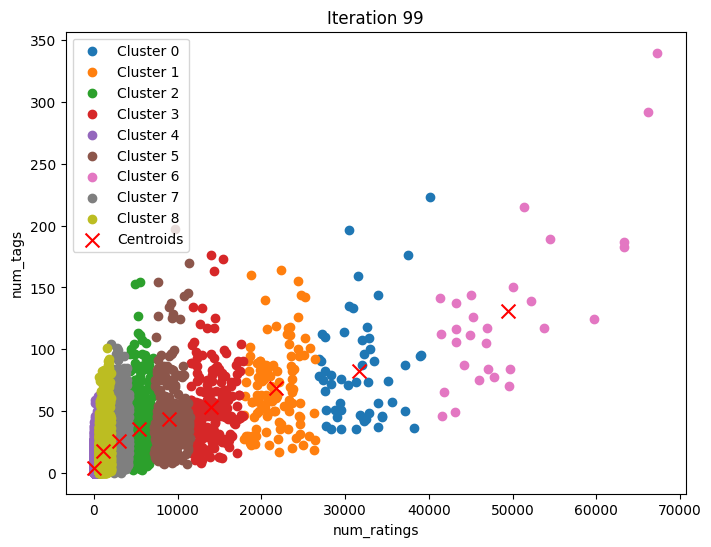

Visualization complete.


In [124]:
visualize_kmeans_iterations(
    data=data_rfe,
    k=9,
    selected_features=[0, 1],  
    selected_features_labels=rfe_selected_features_labels,  
    method="random",
    max_iterations=100
)



Cool to see how it converged to almost the same optimal solution provided by KMeans++ in less iterations and time